In [41]:
import scanpy as sc
import scarches
from scarches.models.scpoli import scPoli
import scib
import os
import anndata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

This notebook is used for the automated cell type annotation for new datasets and the corresponding plots for the figures.

In [3]:
# Subset where atlas_key is 'ref'
adata_ref = adata[adata.obs['atlas_key'] == 'ref'].copy()

# Subset where atlas_key is 'query'
adata_query = adata[adata.obs['atlas_key'] == 'query'].copy()

In [4]:
#load trained reference model
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
    
scpoli_model = scPoli(
adata=adata_ref,
condition_keys="sample",
cell_type_keys="cell_type_level2",
embedding_dims=10,
recon_loss='mse',
)


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:151: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/sc

Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



In [5]:
scpoli_query = scPoli.load_query_data(
    adata=adata_query,
    reference_model=scpoli_model,
    labeled_indices=[],
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:777: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  new_obs_metadata = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



In [6]:
scpoli_loaded = scpoli_query.load(dir_path="models/querymse3-level2", adata=adata_query)

AnnData object with n_obs × n_vars = 2521 × 2000
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level2', 'atlas_key', 'conditions_combined'
    var: 'original_gene_names', 'highly_variable'
    uns: 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'raw_decontXcounts', 'uncorrected_counts'
    obsp: 'connectivities', 'distances'
Embedding dictionary:
 	Num conditions: [61]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


# Bashore dataset

In [3]:
adata_bashore = sc.read_h5ad("tmp/Bashore_postQC_noCITE_noR.h5ad")

In [8]:
adata_bashore.obs["sample"] = [sample + "_Bashore" for sample in adata_bashore.obs["sample"]]

In [11]:
#map gene ids to ensembl
ensembl_id_df = pd.read_csv("gene_names_to_ensembl_ALLFOUND_allfernandez_no6_withallslysz.csv")
gene_to_ensembl = dict(zip(ensembl_id_df['gene_name'], ensembl_id_df['ensembl_id']))
# Map the variable names in AnnData
adata_bashore.var['original_gene_names'] = adata_bashore.var_names
adata_bashore.var_names = [gene_to_ensembl[gene] if gene in gene_to_ensembl else gene for gene in adata_bashore.var_names]

In [14]:
#22 not mapped
non_ENSG_vars = adata_bashore.var_names[~adata_bashore.var_names.str.startswith('ENSG')]
print(len(non_ENSG_vars))

22


In [17]:
# remove not mapped genes
# Convert non_ENSG_vars to a set for faster lookup
non_ENSG_vars_set = set(non_ENSG_vars)

# Filter out the variables that are in non_ENSG_vars_set
adata_bashore = adata_bashore[:, ~adata_bashore.var_names.isin(non_ENSG_vars_set)]

In [20]:
#aggregation
from scipy.sparse import issparse
import scipy.sparse as sparse
# Convert the sparse matrix (if it is sparse) to a dense DataFrame
adata_df = pd.DataFrame(adata_bashore.X.toarray() if issparse(adata_bashore.X) else adata_bashore.X, 
                        index=adata_bashore.obs_names, 
                        columns=adata_bashore.var_names)

# Group by gene names and sum the counts
aggregated_data = adata_df.groupby(adata_df.columns, axis=1).sum()

# Prepare the new 'var' DataFrame, keeping the first occurrence of each gene
unique_var = adata_bashore.var.loc[~adata_bashore.var.index.duplicated(keep='first')]

# Create a new AnnData object with aggregated data
adata_agg = anndata.AnnData(X=aggregated_data, obs=adata_bashore.obs, var=unique_var.loc[aggregated_data.columns])

# 'adata_agg' now has unique gene names and aggregated counts

/tmp/ipykernel_3042980/1880300863.py:10: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  aggregated_data = adata_df.groupby(adata_df.columns, axis=1).sum()


In [21]:
adata_agg

AnnData object with n_obs × n_vars = 77112 × 28599
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'dataset'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'original_gene_names'

In [22]:
adata_agg.X = sparse.csr_matrix(adata_agg.X)

In [23]:
#checks
print("Check how many cells have zero counts for all genes...")
cellwise_sum = adata_agg.X.sum(axis=1)
num_cells_zero_counts = (cellwise_sum == 0).sum()
    
if num_cells_zero_counts>0:
    print(num_cells_zero_counts, " cells were found with 0 counts across all genes! Removing these cells now...")
    adata_agg = adata_agg[cellwise_sum > 0, :]

Check how many cells have zero counts for all genes...


In [24]:
adata_final = adata_agg.copy()

In [25]:
#normalize
#Perform a clustering for scran normalization in clusters
adata_pp = adata_final.copy()
sc.pp.normalize_total(adata_pp, target_sum=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, svd_solver="arpack")
sc.pp.neighbors(adata_pp, n_pcs=30)
sc.tl.leiden(adata_pp, key_added='groups', resolution=0.22)

In [1]:
import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

During startup - Warning messages:
1: Setting LC_COLLATE failed, using "C" 
2: Setting LC_TIME failed, using "C" 
3: Setting LC_MESSAGES failed, using "C" 
4: Setting LC_MONETARY failed, using "C" 
5: Setting LC_PAPER failed, using "C" 
6: Setting LC_MEASUREMENT failed, using "C" 
/tmp/ipykernel_84008/2253401465.py:13: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [27]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata_final.X.T.toarray()

In [28]:
%%R -i data_mat -i input_groups -o size_factors
library(scran)
size_factors = calculateSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/rpy2/ipython/rmagic.py:984: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  displaypub.publish_display_data(


Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: ‘MatrixGenerics’

The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOr

In [29]:
del adata_pp

In [30]:
adata_final.obs['size_factors'] = size_factors

In [31]:
#Normalize adata 
adata_final.X /= adata_final.obs['size_factors'].values[:,None]
sc.pp.log1p(adata_final)

In [32]:
adata_final.write_h5ad("bashore-aggr-QC-log-normalized.h5ad")

In [ ]:
# prepare for reference mapping

In [7]:
adata_final = sc.read_h5ad("bashore-aggr-QC-log-normalized.h5ad")

In [8]:
adata_final.obs['cell_type_level2'] = "unknown"

In [9]:
from scarches.models.base._utils import _validate_var_names

In [10]:
varnames_path = "models/querymse3-level2/var_names.csv"
var_names = np.genfromtxt(varnames_path, delimiter=",", dtype=str)
adata2 = _validate_var_names(adata_final, var_names)

Query data is missing expression data of  9  genes which were contained in the reference dataset.
The missing information will be filled with zeroes.


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


Query data contains expression data of  26608  genes that were not contained in the reference dataset. This information will be removed from the query data object for further processing.
AnnData object with n_obs × n_vars = 77112 × 2000
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'dataset', 'size_factors', 'cell_type_level2'


# Run model

In [11]:
### INSERT YOUR .H5AD ADATA HERE. has to have a "sample" obs and ensembl id vars, and normalized + log1p, cell_type_level2 obs with "unknown" aswell. 
### also varnames need to be selected
adata_query2 = adata2.copy() 

In [12]:
scpoli_query2 = scPoli.load_query_data(
    adata=adata_query2,
    reference_model=scpoli_loaded,
    labeled_indices=[],
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:777: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  new_obs_metadata = adata.obs.groupby('conditions_combined').first()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


Embedding dictionary:
 	Num conditions: [79]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



In [ ]:
scpoli_query2.train(
    n_epochs=50,
    pretraining_epochs=40,
    eta=10
)

In [16]:
scpoli_query2.save("models/bashore-mapping", overwrite=True)

In [13]:
scpoli_query2 = scpoli_query2.load(dir_path="models/bashore-mapping", adata=adata_query2)

AnnData object with n_obs × n_vars = 77112 × 2000
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'dataset', 'size_factors', 'cell_type_level2', 'conditions_combined'
Embedding dictionary:
 	Num conditions: [79]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 45 10
	Mean/Var Layer in/out: 45 10
Decoder Architecture:
	First Layer in, out and cond:  10 45 10
	Output Layer in/out:  45 2000 



/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:156: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  self.obs_metadata_ = adata.obs.groupby(condition_keys).first()


In [14]:
adata_query2.X = adata_query2.X.astype("float32")

In [15]:
results_dict = scpoli_query2.classify(adata_query2, scale_uncertainties=True)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scarches/models/scpoli/scpoli_model.py:454: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  c = torch.tensor(label_tensor, device=device).T


In [16]:
#get whole atlas including reference

#get latent representation of reference data
scpoli_query2.model.eval()
data_latent_source = scpoli_query2.get_latent(
    adata,
    mean=True
)

adata_latent_source = sc.AnnData(data_latent_source)
adata_latent_source.obs = adata.obs.copy()

#get latent representation of query data
data_latent= scpoli_query2.get_latent(
    adata_query2,
    mean=True
)

adata_latent = sc.AnnData(data_latent)
adata_latent.obs = adata_query2.obs.copy()

#get label annotations
adata_latent.obs['cell_type_pred'] = results_dict['cell_type_level2']['preds'].tolist()
adata_latent.obs['cell_type_uncert'] = results_dict['cell_type_level2']['uncert'].tolist()
#adata_latent.obs['classifier_outcome'] = (adata_latent.obs['cell_type_pred'] == adata_latent.obs['cell_type_level1'])

#join adatas
adata_latent_full = adata_latent_source.concatenate(
    [adata_latent],
    batch_key='query'
)


adata_latent_full.obs['cell_type_pred_ref'] = np.where(
    adata_latent_full.obs['query'].isin(['0']),  # Condition
    "Reference",                                # Value if condition is true
    adata_latent_full.obs['cell_type_pred']     # Value if condition is false
)

/tmp/ipykernel_674707/1948131169.py:28: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_latent_full = adata_latent_source.concatenate(


In [18]:
adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"].obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff         85317
CD8              14382
Inflammatory     10473
NK                9893
Monocyte          9292
SMC               9243
B cell            8985
Foamy             8763
Resident          4758
Fibroblast        4658
Fibromyocyte      3519
Proangiogenic     3210
unknown           2521
EndoMT            2052
Mast cell         1857
CD4 Treg          1757
Plasma cell       1610
cDC2              1377
Intimal            539
cDC1               288
Lymphatic           75
CXCL8               66
Name: count, dtype: int64

In [19]:
#get barcodes from unknowns (should be same as adata_query)
adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"][adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"].obs["cell_type_level2"]=="unknown"].obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,...,n_counts,size_factors,cell_type_level1,cell_type_level2,atlas_key,conditions_combined,cell_type_pred,cell_type_uncert,query,cell_type_pred_ref
car05_d_ACTTTGTTCTCAACGA.1-0,Roche,CD8 T,783.0,1401.0,94.0,6.709493,5_Roche,5,singlet,0.297290,...,NaN,0.452209,T cell,unknown,query,NaN,NaN,NaN,0,Reference
car05_d_ATACCGATCCTACCGT.1-0,Roche,EC B,1575.0,4755.0,1.0,0.021030,5_Roche,5,singlet,0.248130,...,NaN,1.478053,EC,unknown,query,NaN,NaN,NaN,0,Reference
car05_d_CCGGTAGTCCGCATAA.1-0,Roche,EC B,1387.0,3600.0,53.0,1.472222,5_Roche,5,singlet,0.501681,...,NaN,0.839104,EC,unknown,query,NaN,NaN,NaN,0,Reference
car05_d_CGGCAGTCAAGCGAAC.1-0,Roche,EC B,955.0,2390.0,1.0,0.041841,5_Roche,5,singlet,0.466826,...,NaN,0.635159,EC,unknown,query,NaN,NaN,NaN,0,Reference
car05_d_GACCAATGTCAAACGG.1-0,Roche,EC B,566.0,1258.0,0.0,0.000000,5_Roche,5,singlet,0.252916,...,NaN,0.299240,EC,unknown,query,NaN,NaN,NaN,0,Reference
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TAGGCATGTTCTGTTT-1-0,Jaiswal,CD4+ T-cells,514.0,802.0,55.0,6.857855,2_Jaiswal,2,singlet,0.005501,...,802.0,0.233214,T cell,unknown,query,NaN,NaN,NaN,0,Reference
Fresh_DTAN_4047_TATCAGGTCGCCGTGA-1-0,Jaiswal,Plasmacytoid DCs,2460.0,9757.0,248.0,2.541765,2_Jaiswal,2,singlet,0.184365,...,9756.0,2.292063,DC,unknown,query,NaN,NaN,NaN,0,Reference
Fresh_DTAN_4047_TCAGCTCTCAGATAAG-1-0,Jaiswal,Plasmacytoid DCs,2802.0,10745.0,190.0,1.768264,2_Jaiswal,2,singlet,0.065983,...,10739.0,2.702644,DC,unknown,query,NaN,NaN,NaN,0,Reference
Fresh_DTAN_4047_TGCACCTAGCAGGCTA-1-0,Jaiswal,Plasmacytoid DCs,2054.0,6122.0,265.0,4.328651,2_Jaiswal,2,singlet,0.012353,...,6120.0,1.651174,DC,unknown,query,NaN,NaN,NaN,0,Reference


In [ ]:
barcodes_query = adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"][adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"].obs["cell_type_level2"]=="unknown"].obs_names
barcodes_query = [barcode[:-2] for barcode in barcodes_query]
barcodes_query

In [21]:
adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"]=="Reference"]

View of AnnData object with n_obs × n_vars = 184635 × 10
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level2', 'atlas_key', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'query', 'cell_type_pred_ref'

In [22]:
# get annotations for unknown level2 (adata_query) in adata from post integration atlas 
atlas_post = sc.read_h5ad("Altas_level2-noprototypes-mse-3-reload.h5ad")

In [23]:
atlas_post.obs.index = [idx[:-2] for idx in atlas_post.obs.index]

In [24]:
atlas_post_filtered = atlas_post[barcodes_query].copy()

In [25]:
atlas_post_filtered.obs

,dataset,cell_type,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,scDblFinder.sample,scDblFinder.class,scDblFinder.score,...,n_counts,size_factors,cell_type_level1,cell_type_level2,atlas_key,conditions_combined,cell_type_pred,cell_type_uncert,query,cell_type_level2_all
car05_d_ACTTTGTTCTCAACGA.1,Roche,CD8 T,783.0,1401.0,94.0,6.709493,5_Roche,5,singlet,0.297290,...,NaN,0.452209,T cell,unknown,query,5_Roche,CD4 TEff,0.296611,1,CD4 TEff
car05_d_ATACCGATCCTACCGT.1,Roche,EC B,1575.0,4755.0,1.0,0.021030,5_Roche,5,singlet,0.248130,...,NaN,1.478053,EC,unknown,query,5_Roche,Lymphatic,0.077543,1,Lymphatic
car05_d_CCGGTAGTCCGCATAA.1,Roche,EC B,1387.0,3600.0,53.0,1.472222,5_Roche,5,singlet,0.501681,...,NaN,0.839104,EC,unknown,query,5_Roche,EndoMT,0.376676,1,EndoMT
car05_d_CGGCAGTCAAGCGAAC.1,Roche,EC B,955.0,2390.0,1.0,0.041841,5_Roche,5,singlet,0.466826,...,NaN,0.635159,EC,unknown,query,5_Roche,Lymphatic,0.226206,1,Lymphatic
car05_d_GACCAATGTCAAACGG.1,Roche,EC B,566.0,1258.0,0.0,0.000000,5_Roche,5,singlet,0.252916,...,NaN,0.299240,EC,unknown,query,5_Roche,Lymphatic,0.334936,1,Lymphatic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Fresh_DTAN_4047_TAGGCATGTTCTGTTT-1,Jaiswal,CD4+ T-cells,514.0,802.0,55.0,6.857855,2_Jaiswal,2,singlet,0.005501,...,802.0,0.233214,T cell,unknown,query,2_Jaiswal,CD4 TEff,0.136874,1,CD4 TEff
Fresh_DTAN_4047_TATCAGGTCGCCGTGA-1,Jaiswal,Plasmacytoid DCs,2460.0,9757.0,248.0,2.541765,2_Jaiswal,2,singlet,0.184365,...,9756.0,2.292063,DC,unknown,query,2_Jaiswal,Inflammatory,0.252621,1,Inflammatory
Fresh_DTAN_4047_TCAGCTCTCAGATAAG-1,Jaiswal,Plasmacytoid DCs,2802.0,10745.0,190.0,1.768264,2_Jaiswal,2,singlet,0.065983,...,10739.0,2.702644,DC,unknown,query,2_Jaiswal,Inflammatory,0.221849,1,Inflammatory
Fresh_DTAN_4047_TGCACCTAGCAGGCTA-1,Jaiswal,Plasmacytoid DCs,2054.0,6122.0,265.0,4.328651,2_Jaiswal,2,singlet,0.012353,...,6120.0,1.651174,DC,unknown,query,2_Jaiswal,Inflammatory,0.158606,1,Inflammatory


In [26]:
# Assuming the barcode is in the index and cell type in the column `cell_type_level2_all` and `cell_type_level2`
# Step 1: Create a mapping from atlas_post_filtered
cell_type_map = atlas_post_filtered.obs['cell_type_level2_all'].to_dict()

# Step 2: Process adata_latent_full to update unknown cell types
for barcode in adata_latent_full.obs.index:
    truncated_barcode = barcode[:-2]  # Remove the last two digits
    if adata_latent_full.obs.at[barcode, 'cell_type_level2'] == "unknown":
        if truncated_barcode in cell_type_map:
            adata_latent_full.obs.at[barcode, 'cell_type_level2'] = cell_type_map[truncated_barcode]


In [27]:
adata_latent_full[adata_latent_full.obs["cell_type_pred_ref"] == "Reference"].obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff         86199
CD8              14548
Inflammatory     11006
NK                9901
Monocyte          9293
SMC               9244
B cell            8987
Foamy             8764
Resident          4763
Fibroblast        4663
Fibromyocyte      3520
Proangiogenic     3488
EndoMT            2197
Mast cell         1861
CD4 Treg          1861
Plasma cell       1610
cDC2              1404
Intimal            698
cDC1               289
Lymphatic          206
CXCL8              133
Name: count, dtype: int64

In [29]:
#rename dict to make level 2 celltypes long names
rename_dict = {
    "CD4 TEff": "CD4 TEff T cell",
    "CD8": "CD8 T cell",
    "Inflammatory": "Inflammatory Macrophage",
    "NK" : "NK",
    "Monocyte": "Monocyte",
    "SMC": "SMC",
    "B cell": "B cell",
    "Foamy": "Foamy Macrophage",
    "Resident": "Resident Macrophage",
    "Fibroblast": "Fibroblast",
    "Proangiogenic": "Proangiogenic EC",
    "Fibromyocyte": "Fibromyocyte",
    "EndoMT": "EndoMT EC",
    "Mast cell": "Mast cell",
    "CD4 Treg" : "CD4 Treg T cell",
    "Plasma cell": "Plasma cell",
    "cDC2": "cDC2 Dentritic cell",
    "cDC1": "cDC1 Dentritic cell",
    "CXCL8": "CXCL8 T cell",
    "Lymphatic": "Lymphatic EC",
    "Intimal": "Intimal EC",
    "Reference": "Reference"
}

In [30]:
# rename level2s in prediction column with reference
adata_latent_full.obs['cell_type_pred'] = adata_latent_full.obs['cell_type_pred'].map(rename_dict)

In [31]:
adata_latent_full.obs['cell_type_pred_ref'] = adata_latent_full.obs['cell_type_pred_ref'].map(rename_dict)

In [33]:
#add cell_type_level2 values from cell_type_pred in query dataset
adata_latent_full.obs["cell_type_level2"] = [cell_type_level2 if cell_type_level2 != "Reference" else original 
                                             for cell_type_level2, original in zip(adata_latent_full.obs["cell_type_pred_ref"], 
                                                                                  adata_latent_full.obs["cell_type_level2"])]

In [35]:
adata_latent_full.obs['cell_type_level2'] = adata_latent_full.obs['cell_type_level2'].map(lambda x: rename_dict.get(x, x))

In [10]:
adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] == "Reference"]

View of AnnData object with n_obs × n_vars = 184635 × 10
    obs: 'dataset', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'scDblFinder.sample', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'symptoms', 'n_genes', 'n_counts', 'size_factors', 'cell_type_level1', 'cell_type_level2', 'atlas_key', 'conditions_combined', 'cell_type_pred', 'cell_type_uncert', 'query', 'cell_type_pred_ref'
    uns: 'cell_type_pred_ref_colors', 'neighbors', 'umap', 'cell_type_level2_colors'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

In [36]:
adata_latent_full.obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff T cell            97615
CD8 T cell                 23165
SMC                        16456
Inflammatory Macrophage    16050
Resident Macrophage        15216
Foamy Macrophage           14782
Monocyte                   12394
NK                         10852
B cell                     10612
Fibroblast                  9859
Fibromyocyte                8450
Proangiogenic EC            6525
CD4 Treg T cell             3900
EndoMT EC                   3837
cDC2 Dentritic cell         3305
Mast cell                   3154
Plasma cell                 2579
Intimal EC                  1049
CXCL8 T cell                 774
Lymphatic EC                 588
cDC1 Dentritic cell          585
Name: count, dtype: int64

In [18]:
adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"].obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff T cell            11416
Resident Macrophage        10453
CD8 T cell                  8617
SMC                         7212
Foamy Macrophage            6018
Fibroblast                  5196
Inflammatory Macrophage     5044
Fibromyocyte                4930
Monocyte                    3101
Proangiogenic EC            3037
CD4 Treg T cell             2039
cDC2 Dentritic cell         1901
EndoMT EC                   1640
B cell                      1625
Mast cell                   1293
Plasma cell                  969
NK                           951
CXCL8 T cell                 641
Lymphatic EC                 382
Intimal EC                   351
cDC1 Dentritic cell          296
Name: count, dtype: int64

In [13]:
bashore = adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"]

In [19]:
bashore[bashore.obs["cell_type_uncert"] < 0.7].obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff T cell            11415
Resident Macrophage        10443
CD8 T cell                  8617
SMC                         7204
Foamy Macrophage            6018
Fibroblast                  5140
Inflammatory Macrophage     5041
Fibromyocyte                4925
Monocyte                    3101
Proangiogenic EC            3036
CD4 Treg T cell             2039
cDC2 Dentritic cell         1900
EndoMT EC                   1624
B cell                      1610
Mast cell                   1283
NK                           951
Plasma cell                  947
CXCL8 T cell                 569
Lymphatic EC                 371
Intimal EC                   351
cDC1 Dentritic cell          296
Name: count, dtype: int64

In [37]:
#add new column level 1

mapping_dict = {
    "CD4 TEff T cell": "T cell",
    "CD8 T cell": "T cell",
    "Inflammatory Macrophage": "Macrophage",
    "NK": "NK",
    "Monocyte": "Monocyte",
    "SMC": "SMC",
    "B cell": "B cell",
    "Foamy Macrophage": "Macrophage",
    "Resident Macrophage": "Macrophage",
    "Fibroblast": "Fibroblast",
    "Fibromyocyte": "Fibromyocyte",
    "Proangiogenic EC": "EC",
    "EndoMT EC": "EC",
    "CD4 Treg T cell": "T cell",
    "Mast cell": "Mast cell",
    "Plasma cell": "Plasma cell",
    "cDC2 Dentritic cell": "DC",
    "Intimal EC": "EC",
    "cDC1 Dentritic cell": "DC",
    "Lymphatic EC": "EC",
    "CXCL8 T cell": "T cell"
}

In [38]:
adata_latent_full.obs['cell_type_level1'] = adata_latent_full.obs["cell_type_level2"].map(mapping_dict).fillna("no map")

In [40]:
sc.pp.neighbors(adata_latent_full, n_neighbors=15)
sc.tl.umap(adata_latent_full)

In [42]:
adata_latent_full.write("tmp/bashore_latent_full.h5ad")

In [47]:
adata_latent_full = sc.read_h5ad('tmp/bashore_latent_full.h5ad')

In [48]:
adata_latent_full.obs["cell_type_level2"].value_counts()

cell_type_level2
CD4 TEff T cell            97615
CD8 T cell                 23165
SMC                        16456
Inflammatory Macrophage    16050
Resident Macrophage        15216
Foamy Macrophage           14782
Monocyte                   12394
NK                         10852
B cell                     10612
Fibroblast                  9859
Fibromyocyte                8450
Proangiogenic EC            6525
CD4 Treg T cell             3900
EndoMT EC                   3837
cDC2 Dentritic cell         3305
Mast cell                   3154
Plasma cell                 2579
Intimal EC                  1049
CXCL8 T cell                 774
Lymphatic EC                 588
cDC1 Dentritic cell          585
Name: count, dtype: int64

In [50]:
# Get unique categories from cell_type_pred
adata_latent_full.obs['cell_type_pred_ref'] = adata_latent_full.obs['cell_type_pred_ref'].astype('category')
categories = adata_latent_full.obs['cell_type_pred_ref'].cat.categories

# Define the default Scanpy palette
default_palette = sc.pl.palettes.default_28

# Create a color palette, setting 'reference' to light gray and other categories to default colors
color_palette = {
    category: (0.84, 0.84, 0.84) if category == 'Reference' else default_palette[i % len(default_palette)]
    for i, category in enumerate(categories)
}

In [52]:
color_palette_level1 = {
    'T cell': '#3182bd',                       # blue for all T cell types
    'Macrophage': '#8c564b',                   # brown for all macrophages
    'Plasma cell': '#9467bd',                  # muted purple
    'Mast cell': '#d62728',                    # red
    'NK': '#98df8a',                           # light green
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    'Fibroblast': '#e377c2',                   # bright pink
    'B cell': '#2ca02c',                       # green
    'DC': '#807dba',                           # violet for dendritic cells
    'EC': '#fdae6b',                           # orange for all endothelial cells  
    'Monocyte': '#c7c7c7'                      # lighter gray
}

In [53]:
color_palette_level2 = {
    'B cell': '#2ca02c',                       # green
    
    'CD4 TEff T cell': '#1E90FF',              # Dodger Blue
    'CD4 Treg T cell': '#40E0D0',              # Turquoise
    'CD8 T cell': '#0047AB',                   # Cobalt Blue
    'CXCL8 T cell': '#483D8B',                 # Dark Slate Blue
    
    'EndoMT EC': '#FFD700',                    # Gold
    'Intimal EC': '#FFDAB9',                   # Peach Puff
    'Lymphatic EC': '#FFBF00',                 # Amber
    'Proangiogenic EC': '#ED9121',             # Carrot Orange
    
    'Fibroblast': '#e377c2',                   # bright pink
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    
    'Foamy Macrophage': '#c49c94',             # light brown
    'Inflammatory Macrophage': '#8b4513',      # saddle brown
    'Resident Macrophage': '#8c564b',          # brown
    
    'Mast cell': '#d62728',                    # red
    
    'Monocyte': '#7f7f7f',                     # medium gray
    
    'NK': '#98df8a',                           # light green
    
    'Plasma cell': '#9467bd',                  # muted purple
    
    'cDC1 Dentritic cell': '#9e9ac8',          # light violet
    'cDC2 Dentritic cell': '#6a51a3',          # dark violet
    
    'Reference': '#c7c7c7'                     # lighter gray
}

In [55]:
sc.settings.figdir = f"figures/"

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


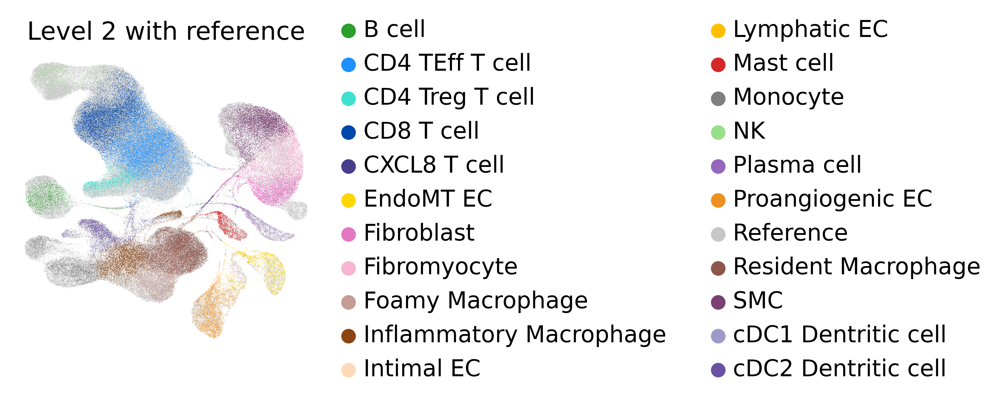

In [56]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full,
    color='cell_type_pred_ref',
    palette=color_palette_level2,
    show=True,
    frameon=False,
    title = "Level 2 with reference",
    save="adata_latent_full_withref.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


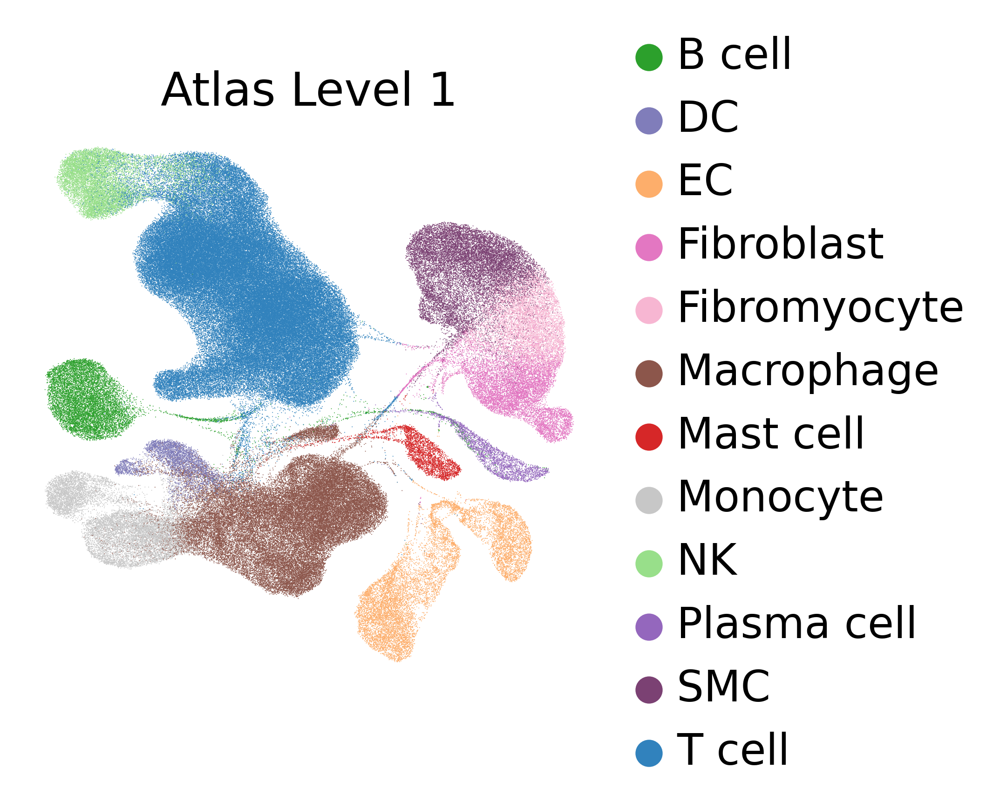

In [57]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full,
    color='cell_type_level1',
    palette=color_palette_level1,
    show=True,
    frameon=False,
    title = "Atlas Level 1",
    save="adata_latent_full_level1.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


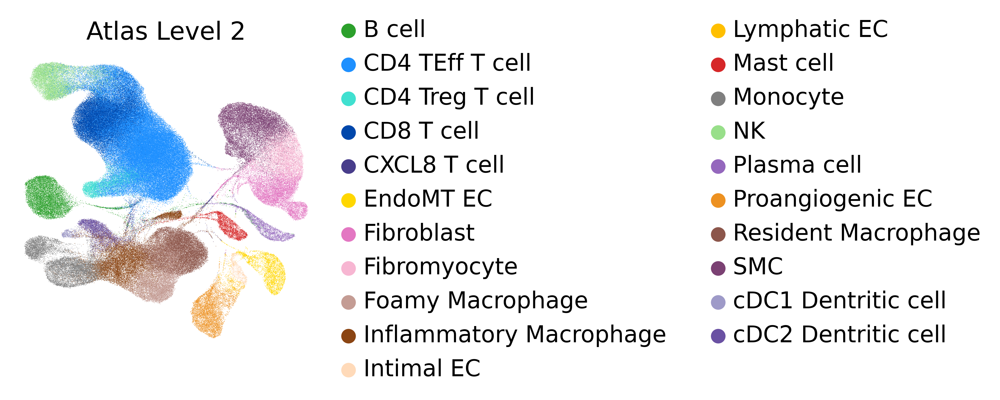

In [58]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full,
    color='cell_type_level2',
    palette=color_palette_level2,
    show=True,
    frameon=False,
    title = "Atlas Level 2",
    save="adata_latent_full_level2.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


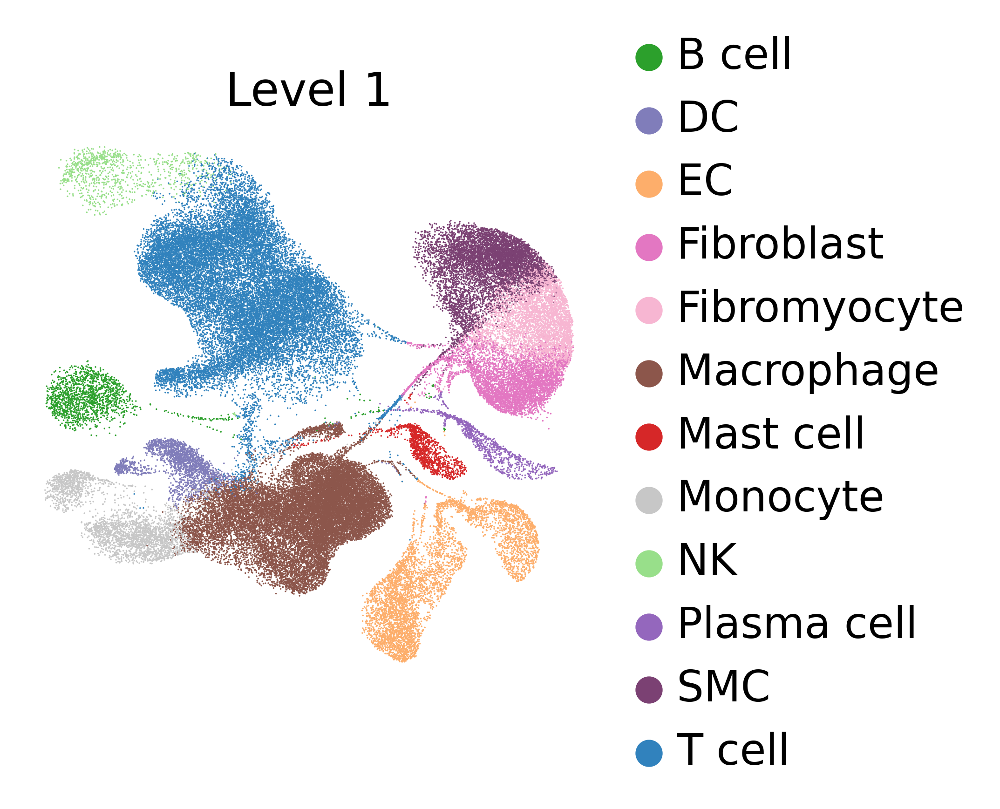

In [59]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"],
    color='cell_type_level1',
    palette=color_palette_level1,
    show=True,
    frameon=False,
    title = "Level 1",
    ncols = 1,
    save="adata_latent_full_noref_onlybashore_level1.pdf"
)

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


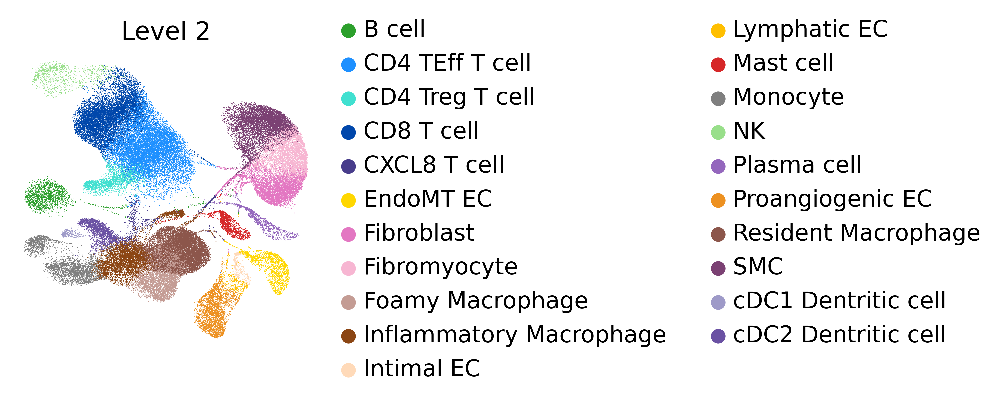

In [60]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"],
    color='cell_type_level2',
    palette=color_palette_level2,
    show=True,
    frameon=False,
    title = "Level 2",
    ncols = 1,
    save="adata_latent_full_noref_onlybashore_level2.pdf"
)

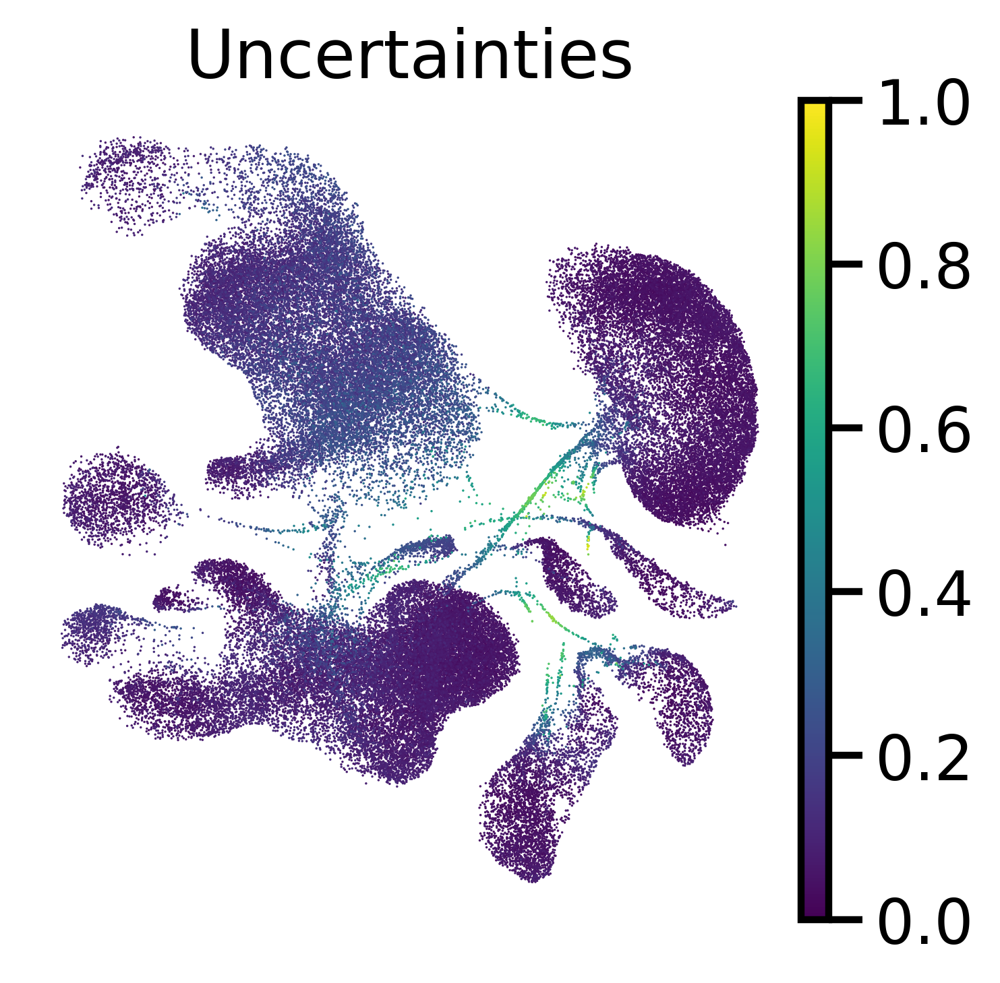

In [61]:
# Plot UMAP with custom color palette
sc.pl.umap(
    adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"],
    color='cell_type_uncert',
    #palette=color_palette,
    show=True,
    frameon=False,
    title = "Uncertainties",
    ncols = 1,
    save="adata_latent_full_noref_uncertain.pdf"
)

In [51]:
#get only bashore dataset
adata_bashore = adata_latent_full[adata_latent_full.obs['cell_type_pred_ref'] != "Reference"]

In [54]:
adata_bashore_counts = sc.read_h5ad("bashore-aggr-QC-log-normalized.h5ad")

In [69]:
level1 = adata_bashore.obs["cell_type_level1"].values
level2 = adata_bashore.obs["cell_type_level2"].values
uncert = adata_bashore.obs["cell_type_uncert"].values

In [72]:
adata_bashore_counts.obs["cell_type_level1"] = level1
adata_bashore_counts.obs["cell_type_level2"] = level2
adata_bashore_counts.obs["cell_type_uncert"] = uncert

In [75]:
adata_bashore_counts.write('tmp/bashore-annot2.h5ad')

# Validate Bashore annotations

## CITE-seq

In [15]:
cite_adata = sc.read_h5ad("tmp/Bashore_onlyCITE.h5ad")

In [16]:
annot_adata = sc.read_h5ad("tmp/bashore-annot2.h5ad")

In [17]:
# Step 1: Intersect barcodes to find common cells in both datasets
common_barcodes = cite_adata.obs_names.intersection(annot_adata.obs_names)

# Filter both datasets to only include common cells
filtered_cite_adata = cite_adata[common_barcodes, :]
filtered_annot_adata = annot_adata[common_barcodes, :]

# Step 2: Transfer the necessary columns from filtered_annot_adata to filtered_cite_adata
# Assuming common_barcodes ensures matching order, check if additional sorting is necessary
filtered_cite_adata.obs['cell_type_level1'] = filtered_annot_adata.obs['cell_type_level1']
filtered_cite_adata.obs['cell_type_level2'] = filtered_annot_adata.obs['cell_type_level2']
filtered_cite_adata.obs['cell_type_uncert'] = filtered_annot_adata.obs['cell_type_uncert']

# Step 3: Filter cells where 'cell_type_uncert' is above 0.7
final_adata = filtered_cite_adata[filtered_cite_adata.obs['cell_type_uncert'] <= 0.7].copy()

/var/tmp/ipykernel_1093554/685636419.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  filtered_cite_adata.obs['cell_type_level1'] = filtered_annot_adata.obs['cell_type_level1']


In [89]:
cite_adata

AnnData object with n_obs × n_vars = 26226 × 283
    obs: 'sample'

In [5]:
filtered_cite_adata

AnnData object with n_obs × n_vars = 24384 × 283
    obs: 'sample', 'cell_type_level1', 'cell_type_level2', 'cell_type_uncert'

In [6]:
final_adata

AnnData object with n_obs × n_vars = 24349 × 283
    obs: 'sample', 'cell_type_level1', 'cell_type_level2', 'cell_type_uncert'

In [18]:
surface_markers_figure2_curated = {
    "B cell": ["CD268_BAFF-R", "CD19", "CD22", "CD20"],
    "DC": ["CD1c", "CD218a_IL-18Ralpha", "CLEC12A", "CD11c", "CD13"], 
    "EC": ["CD144_VE-Cadherin", "CD31", "CD49b", "CD34", "CD201_EPCR"],
    "Fibroblast": ["CD90_Thy1", "CD49a", "CD29", "CD73_Ecto-5p-nucleotidase"],
    "Macrophage": ["CD11b", "CD11c", "CD64", "HLA-E", "CD93", "HLA-A_B_C", "CD13", "CD32", "FolateReceptorBeta", "HLA-DR", "IgLightChainLambda"],
    "Mast cell": ["FcepsilonRIalpha", "CD82", "CD117_c-kit", "IgE"],
    "NK": ["CD16", "CD57_Recombinant", "CD244_2B4", "CD314_NKG2D"],
    "Plasma cell": ["CD19", "CD39", "CD38"],
    "SMC": ["CD146", "CD151_PETA-3", "CD49a", "CD29", "CD142", "EGFR"],
    "T cell": ["CD3", "CD28", "CD5", "CD279_PD-1", "CD2", "CD48", "TCR_alphaBeta", "integrinBeta7"],
    #"Neutrophils": ["CD15_SSEA-1", "CD16", "CD66b", "CD177"]
}

/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()


/home/icb/korbinian.traeuble/miniconda3/envs/jupyter-experimental/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


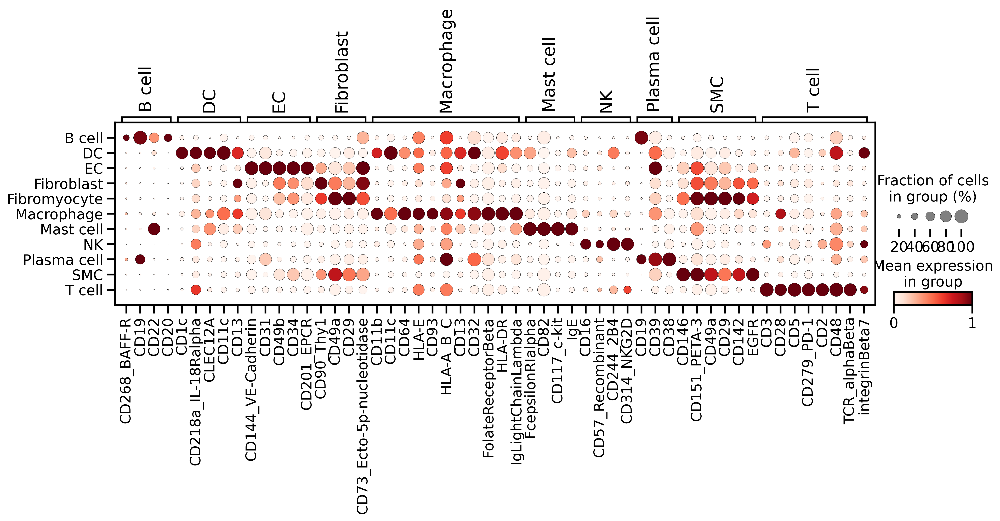

In [19]:
sc.pl.dotplot(
    adata = final_adata[final_adata.obs["cell_type_level1"] != "Monocyte"],
    groupby="cell_type_level1",
    var_names=surface_markers_figure2_curated,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    figsize = (16,3.5),
    save="surface_markers_bashore_figure2_curated_new.pdf"
)

## Confusion matrix with author provided labels

In [20]:
annot_adata = sc.read_h5ad("tmp/bashore-annot2.h5ad")

In [21]:
annot_adata[annot_adata.obs["sample"]=="21_Bashore"].obs

,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,n_counts,dataset,size_factors,cell_type_level1,cell_type_level2,cell_type_uncert
AAACCCACAGAGGACT-1_21,21_Bashore,508,1069.0,270.0,25.257250,508,1069.0,Bashore,0.117167,EC,Proangiogenic EC,0.142961
AAACCCAGTACAAGTA-1_21,21_Bashore,1264,2660.0,231.0,8.684211,1264,2660.0,Bashore,0.389516,SMC,SMC,0.030944
AAACCCATCGGAATTC-1_21,21_Bashore,934,2306.0,390.0,16.912403,934,2306.0,Bashore,0.256794,Macrophage,Foamy Macrophage,0.055138
AAACGAAGTTGTCATG-1_21,21_Bashore,371,540.0,34.0,6.296297,371,540.0,Bashore,0.071163,Fibroblast,Fibroblast,0.268097
AAACGAATCTAGTTCT-1_21,21_Bashore,1270,3514.0,270.0,7.683551,1270,3514.0,Bashore,0.435432,NK,NK,0.085860
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTAACATAG-1_21,21_Bashore,410,643.0,55.0,8.553655,410,643.0,Bashore,0.095594,Fibroblast,Fibroblast,0.048031
TTTGGAGGTGACATCT-1_21,21_Bashore,1907,5554.0,441.0,7.940223,1907,5554.0,Bashore,0.859583,T cell,CD4 Treg T cell,0.290383
TTTGGTTCACCACATA-1_21,21_Bashore,973,2278.0,201.0,8.823529,973,2278.0,Bashore,0.290315,Monocyte,Monocyte,0.063617
TTTGGTTCAGTCGCAC-1_21,21_Bashore,399,572.0,32.0,5.594406,399,572.0,Bashore,0.080232,Macrophage,Inflammatory Macrophage,0.142052


In [22]:
annot_adata

AnnData object with n_obs × n_vars = 77112 × 28599
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'dataset', 'size_factors', 'cell_type_level1', 'cell_type_level2', 'cell_type_uncert'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'original_gene_names'
    uns: 'log1p'

In [23]:
# Filter cells where 'cell_type_uncert' is above 0.7
annot_adata = annot_adata[annot_adata.obs['cell_type_uncert'] <= 0.7].copy()

In [24]:
# read in author provided cell types
bashore_annotations = pd.read_csv("carotid_celltype_annotation.txt", sep="\t")
bashore_annotations

,cell_id,sample,cluster
0,RPE008-AAACCCAAGACAAGCC-1-0,adata_RPE008,Fibroblast
1,RPE008-AAACCCACAAGCCATT-1-0,adata_RPE008,pDC
2,RPE008-AAACCCATCCTTGGAA-1-0,adata_RPE008,CD8+ T Cell 2
3,RPE008-AAACGAAAGTCGAATA-1-0,adata_RPE008,CD4+ T Cell 1
4,RPE008-AAACGAACAGCTTTCC-1-0,adata_RPE008,Fibroblast
...,...,...,...
88088,TTTGGAGGTAACATAG-1-14,adata_RPE034,Fibroblast
88089,TTTGGAGGTGACATCT-1-14,adata_RPE034,CD8+ T Cell 1
88090,TTTGGTTCACCACATA-1-14,adata_RPE034,Macrophage 2
88091,TTTGGTTCAGTCGCAC-1-14,adata_RPE034,Macrophage 1


In [25]:
# remove sample 1,2 and 3 aka RPE004, RPE005, RPE006 because not part of the bashore GSE (but from GSE155512).
bashore_annotations = bashore_annotations[~bashore_annotations['sample'].isin(['adata_RPE004', 'adata_RPE005', 'adata_RPE006'])]

In [26]:
def modify_cell_id(cell_id):
    if cell_id.startswith('R'):
        return cell_id[7:]
    return cell_id

bashore_annotations['cell_id'] = bashore_annotations['cell_id'].apply(modify_cell_id)

/var/tmp/ipykernel_1093554/1427025835.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bashore_annotations['cell_id'] = bashore_annotations['cell_id'].apply(modify_cell_id)


In [27]:
carotid_mapping = {
    "adata_RPE004": "1",
    "adata_RPE005": "2",
    "adata_RPE006": "3",
    "adata_RPE008": "5",
    "adata_RPE010": "7",
    "adata_RPE012": "8",
    "adata_RPE014": "10",
    "adata_RPE015": "11",
    "adata_RPE016": "12",
    "adata_RPE007": "4",
    "adata_RPE009": "6",
    "adata_RPE013": "9",
    "adata_RPE020": "13",
    "adata_RPE022": "14",
    "adata_RPE026": "15",
    "adata_RPE027": "16",
    "adata_RPE029": "17",
    "adata_RPE031A": "18",
    "adata_RPE032": "19",
    "adata_RPE033": "20",
    "adata_RPE034": "21"
}
# Function to modify the cell_id based on the sample
def modify_cell_id(row):
    sample = row['sample']
    new_number = carotid_mapping.get(sample, None)
    if new_number is not None:
        parts = row['cell_id'].rsplit('-', 1)
        return f"{parts[0]}_{new_number}"
    return row['cell_id']

bashore_annotations['cell_id_new'] = bashore_annotations.apply(modify_cell_id, axis=1)

/var/tmp/ipykernel_1093554/246168447.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bashore_annotations['cell_id_new'] = bashore_annotations.apply(modify_cell_id, axis=1)


In [28]:
in_bashore = annot_adata.obs_names.isin(bashore_annotations['cell_id_new'].values)

In [29]:
not_in_bashore = annot_adata.obs_names[~in_bashore].tolist()

In [31]:
bashore_annotations["cluster"].value_counts()

cluster
Macrophage 1          10517
Fibroblast             8413
CD4+ T Cell 1          7969
Macrophage 2           6133
CD8+ T Cell 1          5847
CD4+ T Cell 2          4531
Macrophage 4           4231
Endothelial Cell 1     3661
SMC 2                  3486
SMC 1                  3037
CD8+ T Cell 2          2724
Macrophage 5           2602
Macrophage 3           2573
Endothelial Cell 2     1933
NK Cell                1636
Modulated SMC          1464
Mast Cell              1393
B Cell 1               1067
Plasma Cell             932
Neutrophil              829
SMC 3                   701
pDC                     613
B Cell 2                558
cDC                     448
CD4+ T Cell 3           320
Name: count, dtype: int64

In [32]:
bashore_mapping_dict = {
    "Macrophage": ["Macrophage 1", "Macrophage 2", "Macrophage 3", "Macrophage 4", "Macrophage 5"],
    "Fibroblast": ["Fibroblast"],
    "T cell": ["CD4+ T Cell 1", "CD8+ T Cell 1", "CD4+ T Cell 2", "CD8+ T Cell 2", "CD4+ T Cell 3"],
    "SMC": ["SMC 1", "SMC 2", "SMC 3", "Modulated SMC"], 
    "EC": ["Endothelial Cell 1", "Endothelial Cell 2"],
    "NK": ["NK Cell"],
    "Mast cell": ["Mast Cell"],
    "B cell": ["B Cell 1", "B Cell 2"],
    "Plasma cell": ["Plasma Cell"],
    "unknown": ["Neutrophil"],
    "DC": ["pDC", "cDC"]
}

In [33]:
cell_id_to_cluster = dict(zip(bashore_annotations['cell_id_new'], bashore_annotations['cluster']))

In [34]:
annot_adata.obs['cell_type'] = annot_adata.obs_names.map(lambda x: cell_id_to_cluster.get(x, 'unknown'))

In [35]:
adata_bashore = annot_adata.copy()

In [36]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
import matplotlib.colors as colors

In [37]:
cell_types_bashore = list(adata_bashore.obs["cell_type"].values)

In [38]:
# Invert the bashore_mapping_dict
inverted_bashore_mapping = {v: k for k, values in bashore_mapping_dict.items() for v in values}

# Map each cell type in cell_types, keeping the original value if it's not in the mapping
mapped_cell_types_bashore = [inverted_bashore_mapping.get(cell_type, cell_type) for cell_type in cell_types_bashore]

In [39]:
cell_types_pred_bashore = list(adata_bashore.obs["cell_type_level1"].values)

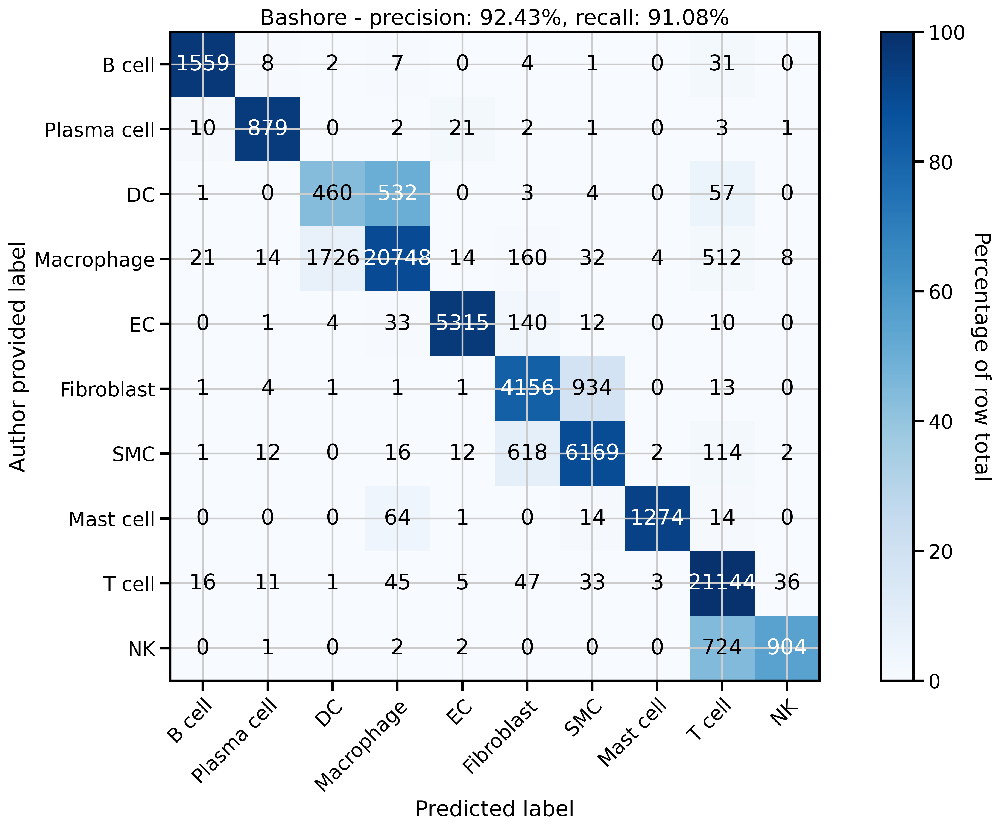

In [40]:
# Define the new order for the cell types
new_order = ["B cell", "Plasma cell", "DC", "Macrophage", "EC", "Fibroblast", "SMC", "Mast cell", "T cell", "NK"]

# Find the intersection of unique cell types in both lists and filter them according to the new order
common_cell_types_bashore = set(mapped_cell_types_bashore) & set(cell_types_pred_bashore)
common_cell_types_bashore = [ct for ct in new_order if ct in common_cell_types_bashore]

# Filter both lists to include only indices where the cell type of the true labels is in the common set
# and the corresponding predicted cell type is also in the common set.
common_indices = [i for i, ct in enumerate(mapped_cell_types_bashore) if ct in common_cell_types_bashore and cell_types_pred_bashore[i] in common_cell_types_bashore]

# Use the common indices to filter both lists
filtered_mapped_cell_types_bashore = [mapped_cell_types_bashore[i] for i in common_indices]
filtered_cell_types_pred_bashore = [cell_types_pred_bashore[i] for i in common_indices]

# Calculate the confusion matrix and accuracy using the new order
conf_matrix_bashore = confusion_matrix(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore, labels=common_cell_types_bashore)
accuracy_bashore = accuracy_score(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore)

# Calculate precision and recall for each class and overall
precision_bashore = precision_score(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore, labels=common_cell_types_bashore, average=None)
recall_bashore = recall_score(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore, labels=common_cell_types_bashore, average=None)
overall_precision_bashore = precision_score(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore, average='weighted')
overall_recall_bashore = recall_score(filtered_mapped_cell_types_bashore, filtered_cell_types_pred_bashore, average='weighted')

# Calculate percentages for coloring (per row)
row_sums = conf_matrix_bashore.sum(axis=1, keepdims=True)
conf_matrix_percentages = conf_matrix_bashore / row_sums * 100

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(15, 10))
norm = colors.Normalize(vmin=0, vmax=100)  # Set vmax to 100 for percentage
im = ax.imshow(conf_matrix_percentages, interpolation='nearest', cmap=plt.cm.Blues, norm=norm)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel('Percentage of row total', rotation=-90, va="bottom")

ax.set(xticks=np.arange(len(common_cell_types_bashore)),
       yticks=np.arange(len(common_cell_types_bashore)),
       xticklabels=common_cell_types_bashore, yticklabels=common_cell_types_bashore,
       title=f'Bashore - precision: {overall_precision_bashore:.2%}, recall: {overall_recall_bashore:.2%}',
       ylabel='Author provided label',
       xlabel='Predicted label')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Add text annotations (showing the original count)
for i in range(conf_matrix_bashore.shape[0]):
    for j in range(conf_matrix_bashore.shape[1]):
        ax.text(j, i, format(conf_matrix_bashore[i, j], 'd'),
                ha="center", va="center",
                color="white" if conf_matrix_percentages[i, j] > 50 else "black")

fig.tight_layout()
plt.savefig("figures/conf_matrix_common_bashore_mse3-reload-level2-new-labels-row-percentage-color.pdf")
#plt.show()

# Plots Reference mapping of Tabula Sapiens

H5ad files of the reference mapping are created with the automated mapping python script / docker container.

In [42]:
color_palette_level1 = {
    'T cell': '#3182bd',                       # blue for all T cell types
    'Macrophage': '#8c564b',                   # brown for all macrophages
    'Plasma cell': '#9467bd',                  # muted purple
    'Mast cell': '#d62728',                    # red
    'NK': '#98df8a',                           # light green
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    'Fibroblast': '#e377c2',                   # bright pink
    'B cell': '#2ca02c',                       # green
    'DC': '#807dba',                           # violet for dendritic cells
    'EC': '#fdae6b',                           # orange for all endothelial cells  
    'Monocyte': '#c7c7c7'                      # lighter gray
}

color_palette_level2 = {
    'B cell': '#2ca02c',                       # green
    
    'CD4 TEff T cell': '#1E90FF',              # Dodger Blue
    'CD4 Treg T cell': '#40E0D0',              # Turquoise
    'CD8 T cell': '#0047AB',                   # Cobalt Blue
    'CXCL8 T cell': '#483D8B',                 # Dark Slate Blue
    
    'EndoMT EC': '#FFD700',                    # Gold
    'Intimal EC': '#FFDAB9',                   # Peach Puff
    'Lymphatic EC': '#FFBF00',                 # Amber
    'Proangiogenic EC': '#ED9121',             # Carrot Orange
    
    'Fibroblast': '#e377c2',                   # bright pink
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    
    'Foamy Macrophage': '#c49c94',             # light brown
    'Inflammatory Macrophage': '#8b4513',      # saddle brown
    'Resident Macrophage': '#8c564b',          # brown
    
    'Mast cell': '#d62728',                    # red
    
    'Monocyte': '#7f7f7f',                     # medium gray
    
    'NK': '#98df8a',                           # light green
    
    'Plasma cell': '#9467bd',                  # muted purple
    
    'cDC1 Dentritic cell': '#9e9ac8',          # light violet
    'cDC2 Dentritic cell': '#6a51a3',          # dark violet
    
    'Reference': '#c7c7c7'                     # lighter gray
}


In [ ]:
for tissue in os.listdir("healthy_mapping/TS"): 
    print(f"Generate plots for {tissue}")
    if tissue == "germline":
        pass
    else:
        adata = sc.read_h5ad(f"healthy_mapping/TS/{tissue}/{tissue}_embedding.h5ad")
        sc.pp.neighbors(adata, n_neighbors=15)
        sc.tl.umap(adata)
        
        sc.settings.figdir = f"healthy_mapping/TS/{tissue}/"
        
        sc.pl.umap(
            adata,
            color=['cell_type_level1'],
            show=True,
            frameon=False,
            palette=color_palette_level1,
            title = "Level 1",
            save=f"{tissue}_level1_new.pdf"
        )
        
        sc.pl.umap(
            adata,
            color= ['cell_type_uncert'],
            show=True,
            frameon=False,
            title = "Uncertainty",
            save=f"{tissue}_uncert_new.pdf"
        )
        
        '''
        sc.pl.umap(
            adata,
            color=['free_annotation'],
            show=True,
            frameon=False,
            title = "Author provided",
            save=f"{tissue}_TS_labels_new.png"
        )
        '''
        
        sc.pl.umap(
            adata,
            color=['cell_type_level2'],
            palette=color_palette_level2,
            show=True,
            frameon=False,
            title = "Level 2",
            save=f"{tissue}_level2_new.pdf"
        )

        '''
        # Abundances 
        adata = adata[adata.obs['cell_type_uncert'] < 0.5].copy()
    
        # Assuming you've already run the value_counts() method
        cell_type_counts = adata.obs['cell_type_level1'].value_counts()
        
        # Create a bar chart
        plt.figure(figsize=(12, 6))
        
        # Plot bars and color them according to the palette
        bars = cell_type_counts.plot(kind='bar', color=[color_palette_level1.get(ct, '#333333') for ct in cell_type_counts.index])
        
        # Customize the chart
        plt.title(f"{tissue} level 1")
        plt.xlabel('Cell Type')
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        # Remove the grid
        plt.grid(False)
        
        # Save the plot
        plt.savefig(f'healthy_mapping/TS/{tissue}/cell_type_abundances_level1_{tissue}.png', dpi=300, bbox_inches='tight')
    
    
        # same for level 2
        cell_type_counts = adata.obs['cell_type_level2'].value_counts()
        
        # Create a bar chart
        plt.figure(figsize=(12, 6))
        
        # Plot bars and color them according to the palette
        bars = cell_type_counts.plot(kind='bar', color=[color_palette_level2.get(ct, '#333333') for ct in cell_type_counts.index])
        
        # Customize the chart
        plt.title(f"{tissue} level 2")
        plt.xlabel('Cell Type')
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        # Remove the grid
        plt.grid(False)
        
        # Save the plot
        plt.savefig(f'healthy_mapping/TS/{tissue}/cell_type_abundances_level2_{tissue}.png', dpi=300, bbox_inches='tight')
        '''

## Confusion matrices

In [43]:
def plot_confusion_matrix(adata, tissue):

    adata = sc.read_h5ad(f"healthy_mapping/TS/{tissue}/{tissue}_embedding.h5ad")

    # remove organ specific cell types
    if tissue == "Bladder":
        remove = ["bladder urothelial cell"]
    elif tissue == "Liver":
        remove = ["Erythrocyte", "Hepatocyte"]
    elif tissue == "Kidney":
        remove = ["kidney epithelial cell"]
    elif tissue == "Vasculature":
        remove = ["erythrocyte"]
    else:
        remove = ["dummy"]

    adata = adata[~adata.obs['free_annotation'].isin(remove), :].copy()

    adata = adata[adata.obs['cell_type_uncert'] < 0.7].copy()
    # Create a cross-tabulation with absolute counts
    confusion_abs = pd.crosstab(adata.obs['free_annotation'], 
                                adata.obs['cell_type_level1'])
    
    # Create a normalized version for color mapping
    confusion_norm = confusion_abs.div(confusion_abs.sum(axis=1), axis=0)
    
    # Calculate dynamic figure size
    n_rows, n_cols = confusion_abs.shape
    #figsize = (max(12, n_cols * 0.6), max(10, n_rows * 0.6))
    
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(12,10))
    
    # Create the heatmap using imshow
    im = ax.imshow(confusion_norm, cmap='Blues', aspect='auto')
    
    # Add text annotations for absolute counts
    for i in range(n_rows):
        for j in range(n_cols):
            count = confusion_abs.iloc[i, j]
            color = 'white' if confusion_norm.iloc[i, j] > 0.5 else 'black'
            ax.text(j, i, str(count), ha='center', va='center', color=color, fontsize = 12)
    
    # Set labels and title
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('Author provided label')
    ax.set_title(tissue)
    
    # Set tick labels
    ax.set_xticks(np.arange(n_cols))
    ax.set_yticks(np.arange(n_rows))
    ax.set_xticklabels(confusion_abs.columns)
    ax.set_yticklabels(confusion_abs.index)
    
    # Rotate x-axis labels for better readability
    plt.setp(ax.get_xticklabels(), rotation=90, ha="right", rotation_mode="anchor")
    
    # Add colorbar
    #cbar = ax.figure.colorbar(im, ax=ax)
    #cbar.ax.set_ylabel('Proportion within free_annotation', rotation=-90, va="bottom")
    
    # Adjust layout to prevent clipping of labels
    plt.tight_layout()
    
    # Show the plot
    #plt.show()

    # Save the plot
    plt.savefig(f'healthy_mapping/TS/{tissue}/conf_matrix_{tissue}.png', dpi=300, bbox_inches='tight')

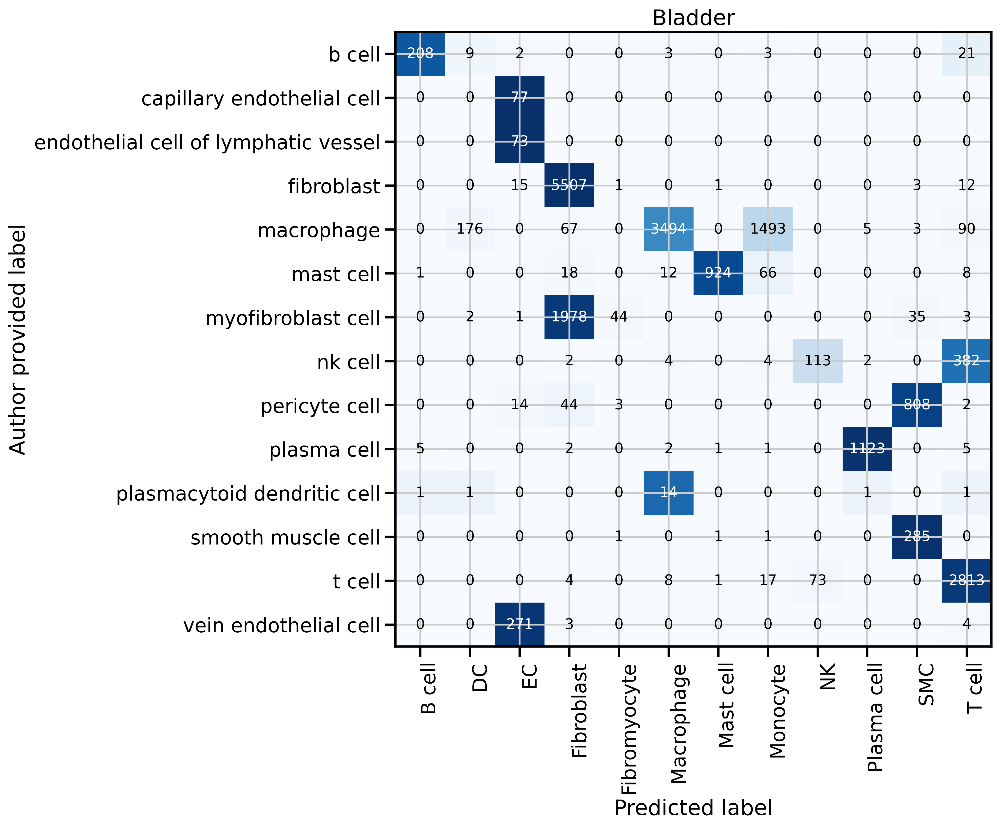

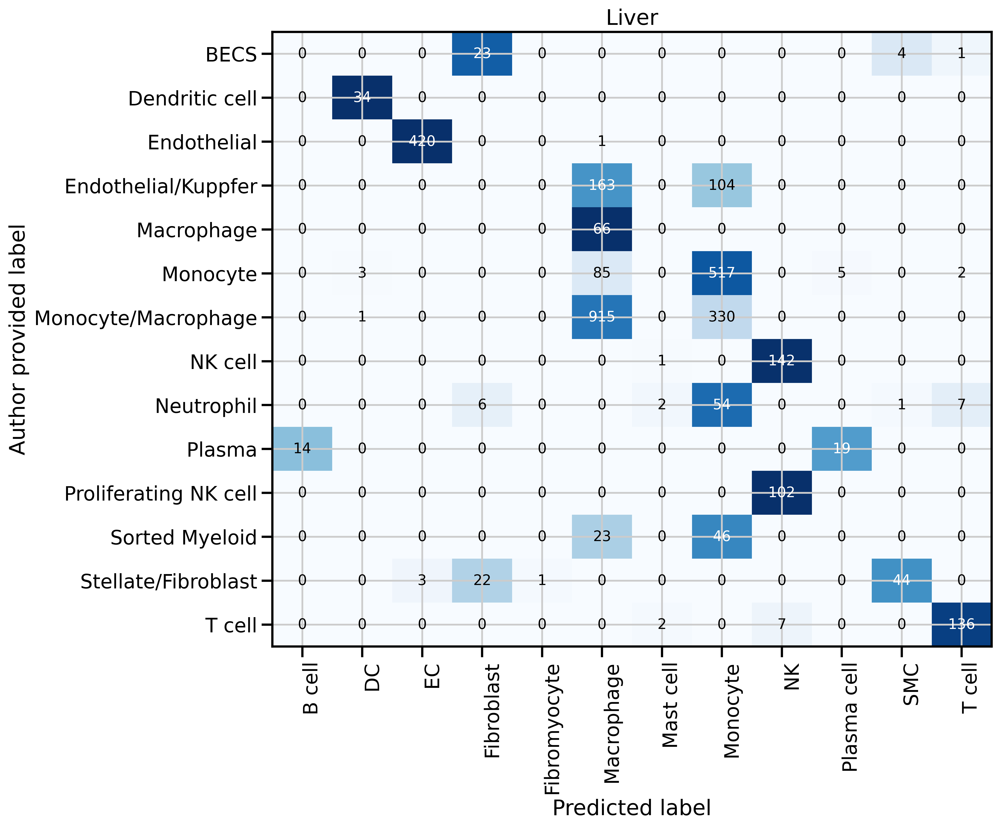

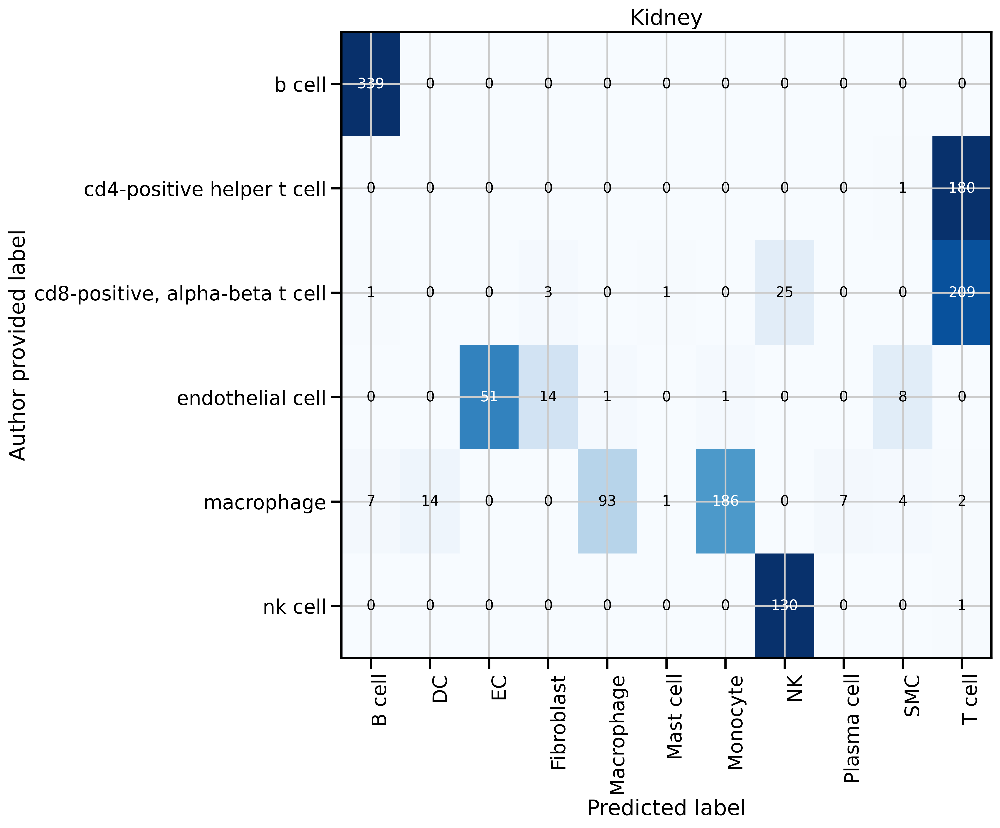

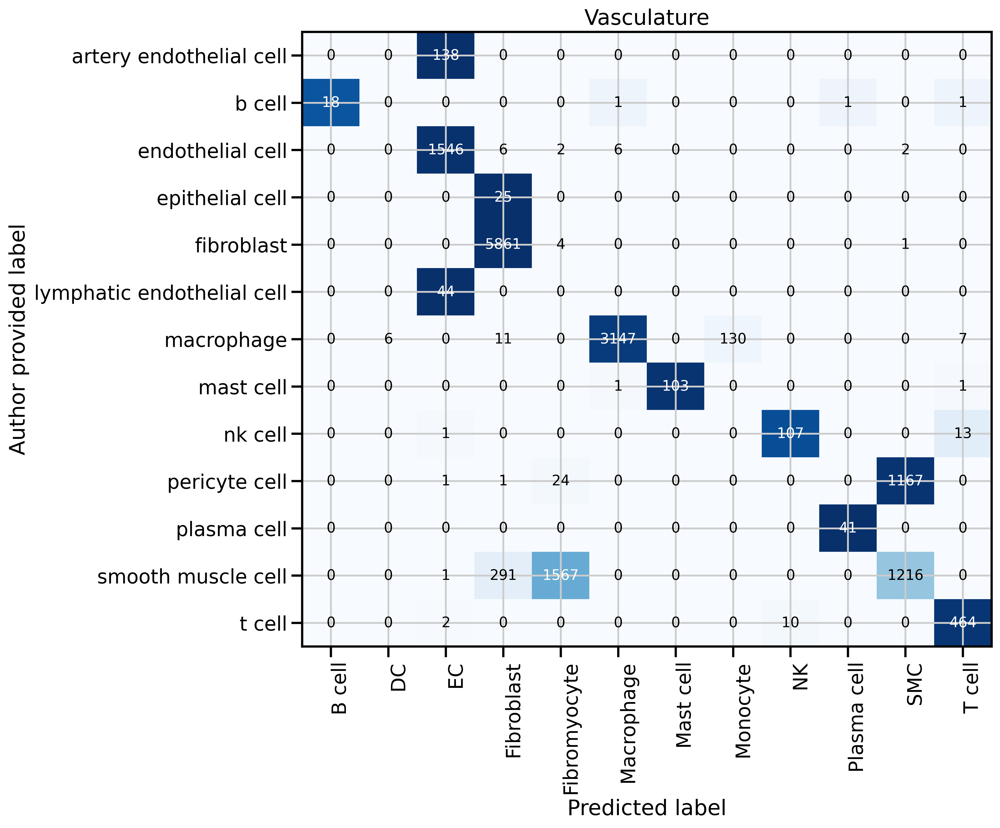

In [44]:
for tissue in ["Bladder", "Liver", "Kidney", "Vasculature"]: 
    plot_confusion_matrix(adata, tissue)

## Specific plots but with matching umap colors for the rest of the paper

In [43]:
color_palette_level1 = {
    'T cell': '#3182bd',                       # blue for all T cell types
    'Macrophage': '#8c564b',                   # brown for all macrophages
    'Plasma cell': '#9467bd',                  # muted purple
    'Mast cell': '#d62728',                    # red
    'NK': '#98df8a',                           # light green
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    'Fibroblast': '#e377c2',                   # bright pink
    'B cell': '#2ca02c',                       # green
    'DC': '#807dba',                           # violet for dendritic cells
    'EC': '#fdae6b',                           # orange for all endothelial cells  
    'Monocyte': '#c7c7c7'                      # lighter gray
}

color_palette_level2 = {
    'B cell': '#2ca02c',                       # green
    
    'CD4 TEff T cell': '#1E90FF',              # Dodger Blue
    'CD4 Treg T cell': '#40E0D0',              # Turquoise
    'CD8 T cell': '#0047AB',                   # Cobalt Blue
    'CXCL8 T cell': '#483D8B',                 # Dark Slate Blue
    
    'EndoMT EC': '#FFD700',                    # Gold
    'Intimal EC': '#FFDAB9',                   # Peach Puff
    'Lymphatic EC': '#FFBF00',                 # Amber
    'Proangiogenic EC': '#ED9121',             # Carrot Orange
    
    'Fibroblast': '#e377c2',                   # bright pink
    'Fibromyocyte': '#f7b6d2',                 # pastel pink
    'SMC': '#7b4173',                          # deeper purple
    
    'Foamy Macrophage': '#c49c94',             # light brown
    'Inflammatory Macrophage': '#8b4513',      # saddle brown
    'Resident Macrophage': '#8c564b',          # brown
    
    'Mast cell': '#d62728',                    # red
    
    'Monocyte': '#7f7f7f',                     # medium gray
    
    'NK': '#98df8a',                           # light green
    
    'Plasma cell': '#9467bd',                  # muted purple
    
    'cDC1 Dentritic cell': '#9e9ac8',          # light violet
    'cDC2 Dentritic cell': '#6a51a3',          # dark violet
    
    'Reference': '#c7c7c7'                     # lighter gray
}


In [44]:
def plot_umap_with_dynamic_colors(adata, color_column, color_palette, title, save_path, tissue):
    # Get unique cell types
    cell_types = adata.obs[color_column].unique()
    
    # Create a color map
    color_map = {}
    for cell_type in cell_types:
        if cell_type in color_palette:
            color_map[cell_type] = color_palette[cell_type]
        else:
            # Generate a random color if not in palette
            random_color = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
            color_map[cell_type] = random_color

    sc.settings.figdir = f"healthy_mapping/TS/{tissue}/"
    
    # Plot
    sc.pl.umap(
        adata,
        color=color_column,
        palette=color_map,
        title=title,
        frameon=False,
        save= save_path #f"{title.replace(' ', '_')}.png"  # Save with a filename based on the title
    )

In [ ]:
for tissue in ["Bladder", "Liver", "Kidney", "Vasculature"]: 

    if tissue == "Bladder":
        Roche_mapping_dict = {
            "T cell": ["t cell"],
            "B cell": ["b cell"],
            "Fibroblast": ["fibroblast"],
            "Fibromyocyte": ["Fibromyocyte"],
            "EC": ["capillary endothelial cell", "endothelial cell of lymphatic vessel", "vein endothelial cell"],
            "Macrophage": ["macrophage"],
            "NK": ["nk cell"],
            "SMC": ["smooth muscle cell"],
            "Mast cell": ["mast cell"],
            "Plasma cell": ["plasma cell"],
            "DC": ["plasmacytoid dendritic cell"]
        }
    
    elif tissue == "Kidney":
        Roche_mapping_dict = {
            "T cell": ["cd8-positive, alpha-beta t cell" , "cd4-positive helper t cell"],
            "B cell": ["b cell"],
            "EC": ["endothelial cell"],
            "Macrophage": ["macrophage"],
            "NK": ["nk cell"],
    }
    
    elif tissue == "Liver":
        Roche_mapping_dict = {
            "T cell": ["T cell"],
            "EC": ["Endothelial"],
            "NK": ["NK cell", "Proliferating NK cell"],
            "DC": ["Dendritic cell"],
            "Plasma cell": ["Plasma"]
    }
    
    elif tissue == "Vasculature":
        Roche_mapping_dict = {
            "T cell": ["t cell"],
            "SMC": ["smooth muscle cell"],
            "Plasma cell": ["plasma cell"],
            "NK": ["nk cell"],
            "Mast cell": ["mast cell"],
            "Macrophage": ["macrophage"],
            "EC": ["lymphatic endothelial cell","artery endothelial cell", "endothelial cell", "epithelial cell"],
            "Fibroblast": ["fibroblast"],
            "B cell": ["b cell"]
    }

    adata = sc.read_h5ad(f"healthy_mapping/TS/{tissue}/{tissue}_embedding.h5ad")
    sc.pp.neighbors(adata, n_neighbors=15)
    sc.tl.umap(adata)

    inverted_Roche_mapping = {v: k for k, values in Roche_mapping_dict.items() for v in values}

    # rename the "free_annotation" obs cell types according to the mapping dict. if its not in the mapping, keep the original
    adata.obs['mapped_annotation'] = adata.obs['free_annotation'].map(lambda x: inverted_Roche_mapping.get(x, x))

    
    plot_umap_with_dynamic_colors(
        adata,
        color_column='mapped_annotation',
        color_palette=color_palette_level1,
        title="Author provided",
        save_path=f"{tissue}_TS_labels_newcolors.pdf",
        tissue=tissue
    )

    sc.settings.figdir = f"healthy_mapping/TS/{tissue}/"
    sc.pl.umap(
            adata,
            color=['cell_type_level1'],
            show=True,
            frameon=False,
            palette=color_palette_level1,
            title = "Level 1",
            save=f"{tissue}_level1_new.pdf"
        )
        
    sc.pl.umap(
            adata,
            color= ['cell_type_uncert'],
            show=True,
            frameon=False,
            title = "Uncertainty",
            save=f"{tissue}_uncert_new.pdf"
        )

    sc.pl.umap(
            adata,
            color=['cell_type_level2'],
            palette=color_palette_level2,
            show=True,
            frameon=False,
            title = "Level 2",
            save=f"{tissue}_level2_new.pdf"
        )

# Hu et al dataset preparation

In [40]:
adata = sc.read_10x_mtx("/ictstr01/home/icb/korbinian.traeuble/projects/Roche/hpc-data-transfer/Roche_main/data/Plaque-atlas/healthy_mapping/Hu/merged")

In [41]:
adata

AnnData object with n_obs × n_vars = 129465 × 33538
    var: 'gene_ids', 'feature_types'

In [42]:
adata.var

,gene_ids,feature_types
MIR1302-2HG,ENSG00000243485,Gene Expression
FAM138A,ENSG00000237613,Gene Expression
OR4F5,ENSG00000186092,Gene Expression
AL627309.1,ENSG00000238009,Gene Expression
AL627309.3,ENSG00000239945,Gene Expression
...,...,...
AC233755.2,ENSG00000277856,Gene Expression
AC233755.1,ENSG00000275063,Gene Expression
AC240274.1,ENSG00000271254,Gene Expression
AC213203.1,ENSG00000277475,Gene Expression


In [43]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [44]:
# acc to authors
print('Number of cells : {:d}'.format(adata.n_obs))
sc.pp.filter_genes(adata, min_cells=3) #acc to author

print('Number of cells : {:d}'.format(adata.n_obs))
sc.pp.filter_cells(adata, min_genes=200)  #acc to author
sc.pp.filter_cells(adata, max_genes=4000) # acc to author

print('Number of cells : {:d}'.format(adata.n_obs))
adata = adata[adata.obs['pct_counts_mt'] < 20] #acc to author

print('Number of cells : {:d}'.format(adata.n_obs))

Number of cells : 129465
Number of cells : 129465
Number of cells : 127097
Number of cells : 125256


In [48]:
adata.obs["sample"] = [barcode.split("-")[1] for barcode in adata.obs.index]

/tmp/ipykernel_2202584/137434769.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["sample"] = [barcode.split("-")[1] for barcode in adata.obs.index]


In [50]:
adata.obs["sample"].value_counts()

sample
S1_CA     22659
S2_CA1    15035
S2_CA2    14676
S2_AO     12020
S1_AO     10031
S2_PA      9844
S3_CA1     9821
S3_AO1     8363
S3_AO2     8327
S3_CA2     7783
S3_PA      6697
Name: count, dtype: int64

In [52]:
adata

AnnData object with n_obs × n_vars = 125256 × 25335
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'sample'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

In [53]:
# use gene_ids as varnames
adata.var['original_gene_names'] = adata.var_names
adata.var_names = adata.var['gene_ids']

In [55]:
adata.write("/ictstr01/home/icb/korbinian.traeuble/projects/Roche/hpc-data-transfer/Roche_main/data/Plaque-atlas/healthy_mapping/Hu/Hu.h5ad") # used with mapping script / docker container